In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import statsmodels as st

In [6]:
data = pd.read_csv('Adidas.csv')
data.head()

,Retailer,Retailer ID,Invoice Date,Region,State,City,Product,Price per Unit,Units Sold,Total Sales,Operating Profit,Operating Margin,Sales Method
0,Foot Locker,1185732,2020-01-01 00:00:00,Northeast,New York,New York,Men's Street Footwear,50.0,1200,600000.0,300000.0,0.50,In-store
1,Foot Locker,1185732,2020-01-02 00:00:00,Northeast,New York,New York,Men's Athletic Footwear,50.0,1000,500000.0,150000.0,0.30,In-store
2,Foot Locker,1185732,2020-01-03 00:00:00,Northeast,New York,New York,Women's Street Footwear,40.0,1000,400000.0,140000.0,0.35,In-store
3,Foot Locker,1185732,2020-01-04 00:00:00,Northeast,New York,New York,Women's Athletic Footwear,45.0,850,382500.0,133875.0,0.35,In-store
4,Foot Locker,1185732,2020-01-05 00:00:00,Northeast,New York,New York,Men's Apparel,60.0,900,540000.0,162000.0,0.30,In-store


<h1> Pleminary Data Exploration

In [3]:
data.shape

(9648, 13)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9648 entries, 0 to 9647
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Retailer          9648 non-null   object 
 1   Retailer ID       9648 non-null   int64  
 2   Invoice Date      9648 non-null   object 
 3   Region            9648 non-null   object 
 4   State             9648 non-null   object 
 5   City              9648 non-null   object 
 6   Product           9648 non-null   object 
 7   Price per Unit    9648 non-null   float64
 8   Units Sold        9648 non-null   int64  
 9   Total Sales       9648 non-null   float64
 10  Operating Profit  9648 non-null   float64
 11  Operating Margin  9648 non-null   float64
 12  Sales Method      9648 non-null   object 
dtypes: float64(4), int64(2), object(7)
memory usage: 980.0+ KB


In [21]:
data['Invoice Date'] = pd.to_datetime(data['Invoice Date'])

In [6]:
data.nunique()

Retailer               6
Retailer ID            4
Invoice Date         724
Region                 5
State                 50
City                  52
Product                6
Price per Unit        94
Units Sold           361
Total Sales         3140
Operating Profit    5618
Operating Margin      66
Sales Method           3
dtype: int64

In [7]:
print('Categorical Features:')
cat = {}
for dat in data.columns:
    if (data[dat].nunique() < 10): #Features with less than 10 distinct categories classified as categorical
        cat[dat] = data[dat].nunique()
        print(f'{dat} has {data[dat].nunique()} classes')

Categorical Features:
Retailer has 6 classes
Retailer ID has 4 classes
Region has 5 classes
Product has 6 classes
Sales Method has 3 classes


In [8]:
print('Discrete Features: ')
disc = []
for dat in data.columns:
    if(data[dat].dtype == 'object'): 
        disc.append(dat)
        print(dat)

Discrete Features: 
Retailer
Region
State
City
Product
Sales Method


In [9]:
cont = []
for dat in data.columns:
    if dat not in disc and dat not in cat.keys() and dat != 'Invoice Date': # Rest of features are continous
        cont.append(dat)

In [10]:
cat

{'Retailer': 6, 'Retailer ID': 4, 'Region': 5, 'Product': 6, 'Sales Method': 3}

In [11]:
data.duplicated().sum() #No duplicated rows present

0

In [12]:
data.isna().sum() # No NaN values present

Retailer            0
Retailer ID         0
Invoice Date        0
Region              0
State               0
City                0
Product             0
Price per Unit      0
Units Sold          0
Total Sales         0
Operating Profit    0
Operating Margin    0
Sales Method        0
dtype: int64

<h2> Conclusion of Pleminary Data Exploration </h2>
<ul>
    <li><h4>Data Has 13 columns and 9648 rows</h4></li>
    <li><h4>Data set has 0 NaN values and 0 Duplicated Columns</h4></li>
    <li><h4>Data 'Invoice Date' was converted to correct Date-Time format</h4></li>
    <li><h4>Cateorical features (less than 10 unique classes) were seperated in a dict 'cat'</h4></li>
    <li><h4>Continous features (Numeric) were stored in a list 'cont'</h4></li>
    <li><h4>Discrete features (String) were stored in a list 'disc'</h4></li>
</ul>

<h1> Stastical Analysis of Numeric data

<Axes: >

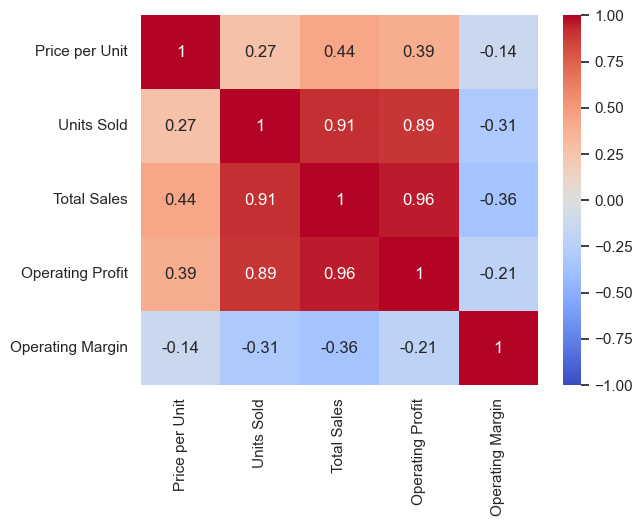

In [109]:
data_nums = data[['Price per Unit','Units Sold','Total Sales','Operating Profit','Operating Margin']]
sns.heatmap(data_nums.corr() , annot=True, cmap='coolwarm' , vmax=1,vmin=-1)

In [155]:
def Correlation(data , threshhold):
    '''Inputs: dataframe: data (Numerical)
               threshold value for correlation
       Output: Columns with correlation values >= threshhold
    '''
    corr_cols = set()
    corr_mat = data.corr()
    for i in range(len(corr_mat.columns)):
        for j in range(i):
            if abs(corr_mat.iloc[i,j]) > threshhold:
                col = corr_mat.columns[i]
                corr_cols.add(col)
    return corr_cols
z = Correlation(data_nums , 0.7)

In [156]:
z

{'Operating Profit', 'Total Sales'}

In [14]:
#OBSERVATION --> The Negative Correlation between Total Sales , Units Sold and PPU and Operating Margin needs to be explored
# Good Features --> Units Sold v/s Total Sales Opearating Profit v/s Total Sales

/Users/aditya/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/aditya/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/aditya/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/aditya/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Co

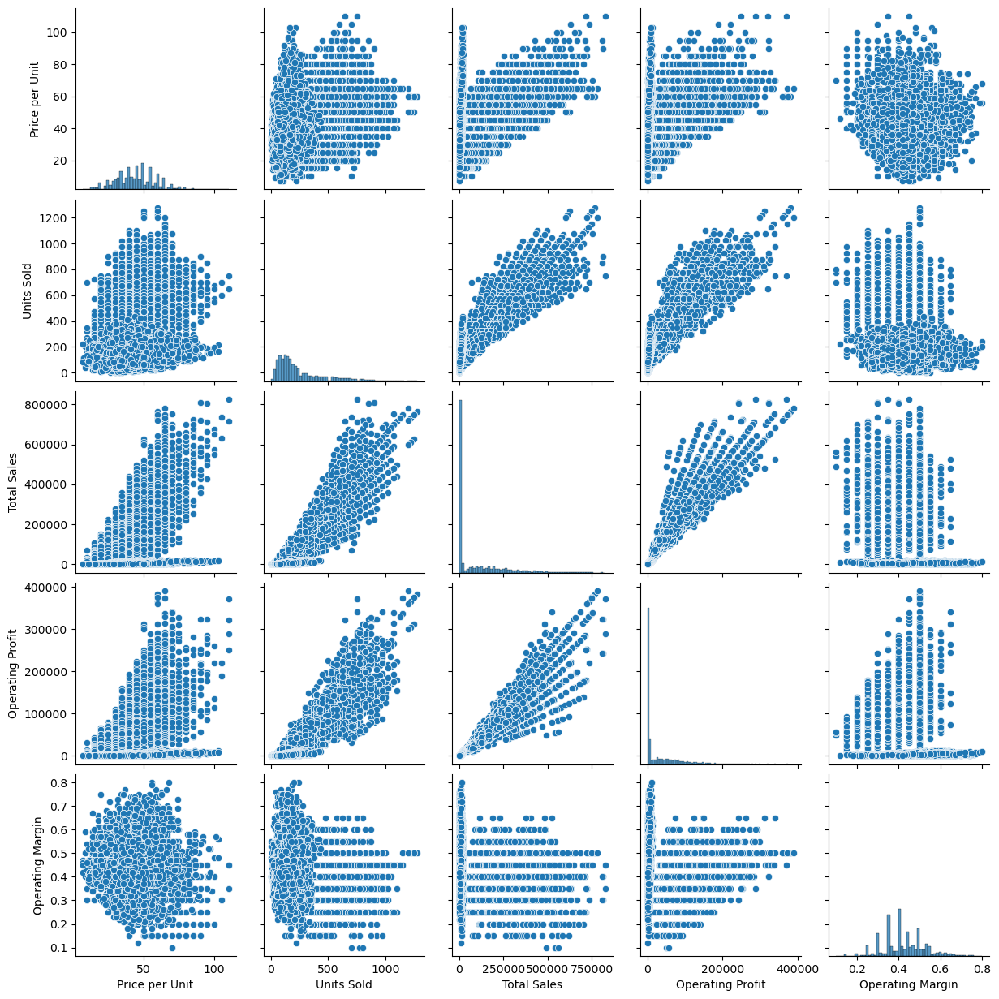

In [15]:
sns.pairplot(data_nums)

In [16]:
# Check skew and kurtosis for distribution

In [17]:
data_nums.skew()

Price per Unit      0.362445
Units Sold          1.462257
Total Sales         1.841359
Operating Profit    2.233598
Operating Margin    0.227482
dtype: float64

In [18]:
# PPU And operating margin is ~Normal Whereas the rest of the data seems to be Skewed to right

In [19]:
data_nums.kurtosis() - 3 #Excess Kurtosis

Price per Unit     -2.569814
Units Sold         -1.300301
Total Sales         0.143842
Operating Profit    2.820367
Operating Margin   -2.824704
dtype: float64

In [ ]:
#Total Sales is ~ Normal whereas PPU and Operating margin are Platykurtic and Operating Profit is Leptokurtic

In [20]:
data_nums.describe().T

,count,mean,std,min,25%,50%,75%,max
Price per Unit,9648.0,45.216625,14.705397,7.0,35.0000,45.00,55.00,110.0
Units Sold,9648.0,256.930037,214.252030,0.0,106.0000,176.00,350.00,1275.0
Total Sales,9648.0,93273.437500,141916.016727,0.0,4254.5000,9576.00,150000.00,825000.0
Operating Profit,9648.0,34425.244761,54193.113713,0.0,1921.7525,4371.42,52062.50,390000.0
Operating Margin,9648.0,0.422991,0.097197,0.1,0.3500,0.41,0.49,0.8


<h2> Results of Pleminary Statistical Analysis:</h2>
    <ul>
    <li><h4>Based on Pearson Corelation values, following features have been identified for further exploration :</h4>
        <ol>
            <h4><li>Operating Margin : Contradictory Co-relation (expected +)</li></h4>
            <h4><li>Total Sale/s v/s Price per Unit : Good + correlation</li></h4>
        </ol>
        </li>
    <li><h4>Based on Skewness of Data It is noted that 'Operating Profit' ,'Total Sales' , 'Units Sold' have large skews (+) which need to be removed before use in any predictive model.</h4></li>
    <li><h4>Excess Kurtosis of Data reveals that 'Price per Unit' , 'Units Sold' and 'Operating Margin' are platykurtic while 'Total Sales' is mesokurtic and 'Operating Profit' is leptokurtic.</h4></li>
    </ul>

<h1> Data Visualisation and EDA

<h3>Goals of EDA: </h3>
<ul>
    <li><h4>Sales Performance Analysis</h4></li>
    <li><h4>Efficiency of Sales Methods:</h4></li>
    <li><h4>Regional Market Analysis</h4></li>
    <li><h4>Product Range Optimization</h4></li>
    <li><h4>Profit Margin analysis</h4></li>
    <li><h4>Market and Segment Expansion Opportunities</h4></li>
</ul>

<h2> Part-1 Analysis by Sales Performance

In [21]:
#Product performance
product_by_sales = data.groupby(['Product']).agg({'Total Sales':'sum'}).reset_index()
product_by_sales = product_by_sales.sort_values(by = ['Total Sales'] , ascending = False)
product_by_sales.head()

,Product,Total Sales
2,Men's Street Footwear,208826244.0
3,Women's Apparel,179038860.0
1,Men's Athletic Footwear,153673680.0
5,Women's Street Footwear,128002813.0
0,Men's Apparel,123728632.0


Text(0.5, 1.0, 'Products by Net Sales')

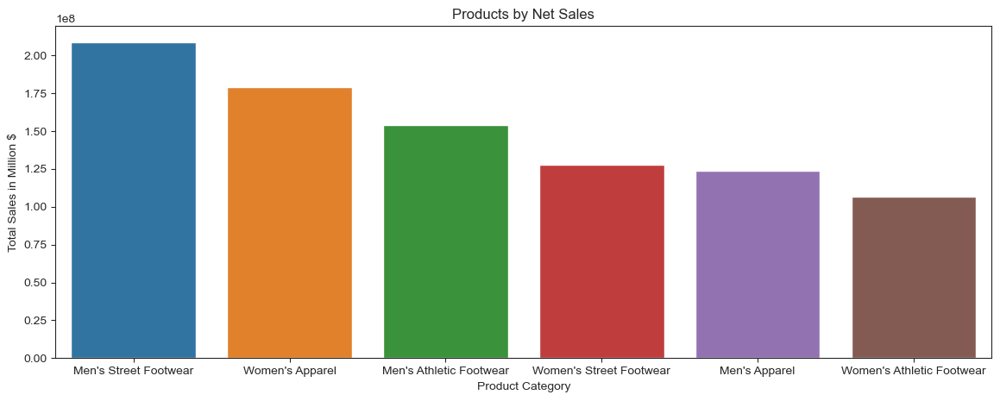

In [22]:
#plot
plt.figure(figsize = (14,5))
sns.set_style('ticks')
sns.barplot(product_by_sales , x = 'Product' ,  y = 'Total Sales')
plt.xlabel('Product Category')
plt.ylabel('Total Sales in Million $')
plt.title('Products by Net Sales')

In [ ]:
# Mens Street Footwear is the Leading product whereas Women's Atheletic Footwear is the worst performer.

In [23]:
product_by_region = data.groupby(['Region','Product']).agg({'Total Sales':'sum'}).reset_index()
product_by_region = product_by_region.sort_values(by = ['Region','Total Sales'] , ascending = False)
product_by_region.head()

,Region,Product,Total Sales
26,West,Men's Street Footwear,55014613.0
27,West,Women's Apparel,52191046.0
25,West,Men's Athletic Footwear,50006339.0
29,West,Women's Street Footwear,42520111.0
24,West,Men's Apparel,35694003.0


In [24]:
data['Total Profit'] = data['Total Sales'] - data['Operating Profit'] # Defing Total Profit as Total Sales - Operating Profit

In [25]:
sales_per_product = data.groupby('Product')[["Total Sales", "Total Profit"]].sum().reset_index()
sales_per_product = sales_per_product.sort_values(by = 'Total Sales' , ascending = False)
sales_per_product.head()
sales_per_product['Average Profit'] = sales_per_product['Total Profit']/sales_per_product['Total Sales']
sales_per_product['Total Profit'] = sales_per_product['Total Profit']/1e6
sales_per_product['Total Sales'] = sales_per_product['Total Sales']/1e6
sales_per_product = sales_per_product.rename(columns={"Total Profit" : "Total Profit (Mil $)" , "Total Sales":"Total Sales (Mil $)"})
sales_per_product.head(6)

,Product,Total Sales (Mil $),Total Profit (Mil $),Average Profit
2,Men's Street Footwear,208.826244,126.023983,0.603487
3,Women's Apparel,179.038860,110.387889,0.616558
1,Men's Athletic Footwear,153.673680,101.826792,0.662617
5,Women's Street Footwear,128.002813,82.906986,0.647697
0,Men's Apparel,123.728632,78.965602,0.638216
4,Women's Athletic Footwear,106.631896,67.656111,0.634483


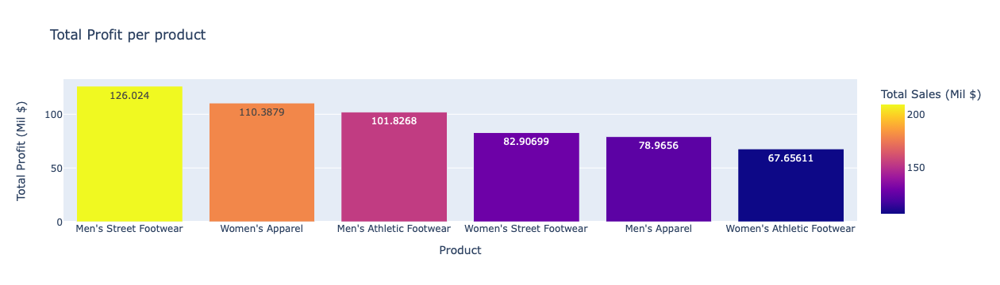

In [26]:
fig = go.Figure()
fig = px.bar(sales_per_product , x = 'Product' , y = 'Total Profit (Mil $)' , color='Total Sales (Mil $)' , title="Total Profit per product" , text_auto=True)
fig.show()

In [16]:
best_retailer = data.groupby('Retailer')['Total Sales'].sum().reset_index()
best_retailer = best_retailer.sort_values(by = ['Total Sales'] , ascending = False)
best_retailer.head()

,Retailer,Total Sales
5,West Gear,242964333.0
1,Foot Locker,220094720.0
3,Sports Direct,182470997.0
2,Kohl's,102114753.0
0,Amazon,77698912.0


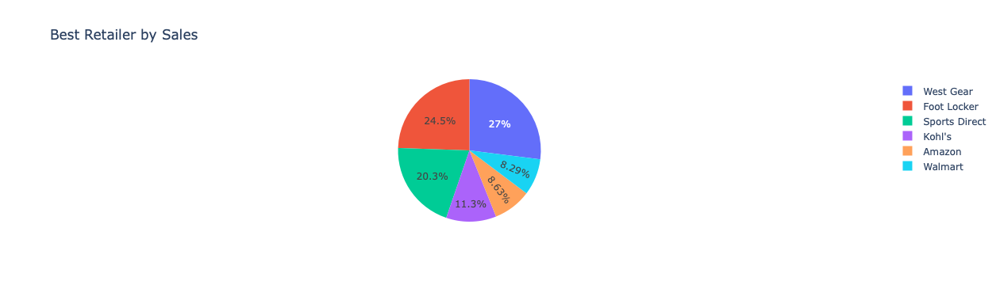

In [18]:
plt = px.pie(best_retailer , names = 'Retailer' , values = 'Total Sales' , title = 'Best Retailer by Sales')
plt.show()

In [19]:
#West Gear , Foot Locker and Sports Direct are the leading Retailers for Adidas by Total Sales

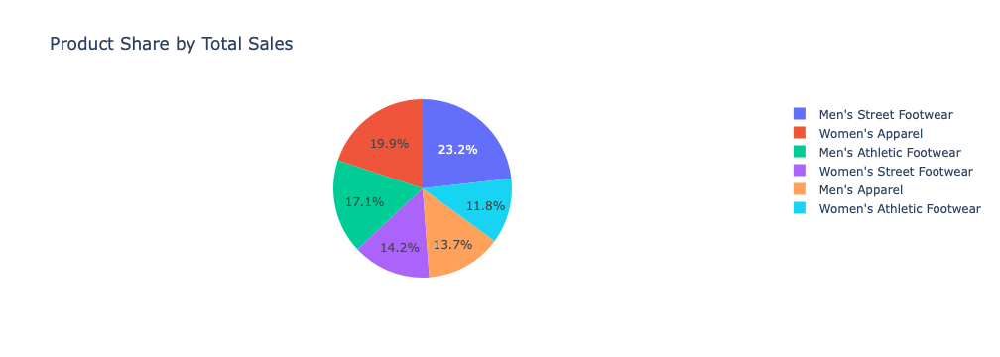

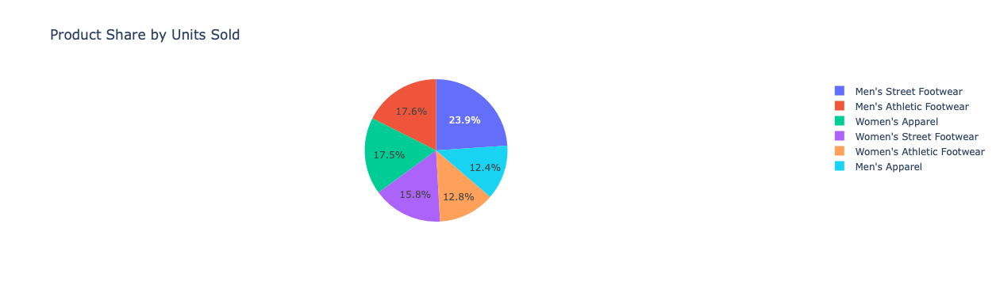

In [27]:
plt = px.pie(sales_per_product , names = 'Product' , values = 'Total Sales (Mil $)' , title='Product Share by Total Sales')
plt.show()
plt = px.pie(data , names = 'Product' , values = 'Units Sold' , title='Product Share by Units Sold')
plt.show()

<h3>Conclusion to Sales Performance Analysis</h3>
<ol>
<h4><li>Mens Street Footwear is the top contributer to Total Sales making up ~25% of the total revenue and Units Sold followed by Women's Apparel which makes ~20% Revenue with ~18% Units Sold.</li></h4>
<h4><li>Women's Atheletic Footware and Men's Apparel are underperformers.</li></h4>
</ol>

<h2>Part-2 Sales Analysis by Region</h2>

In [53]:
units_per_product = data.groupby(['State'])[['Units Sold','Total Sales']].sum().reset_index()
units_per_product = units_per_product.sort_values(by = ['Units Sold','State'] , ascending=[False, True])
units_per_product.head()

,State,Units Sold,Total Sales
31,New York,169140,64229039.0
4,California,163284,60174133.0
42,Texas,159500,46359746.0
8,Florida,133430,59283714.0
39,South Carolina,72610,29285637.0


In [54]:
units_per_product.tail(6)
#New York is leading the sales by state wheras Nebraska , Minnesota and Maryland is underperforming

,State,Units Sold,Total Sales
40,South Dakota,22973,8495576.0
33,North Dakota,22781,7735580.0
18,Maine,22410,9195978.0
22,Minnesota,20838,7378068.0
19,Maryland,20818,7758059.0
26,Nebraska,19154,5929038.0


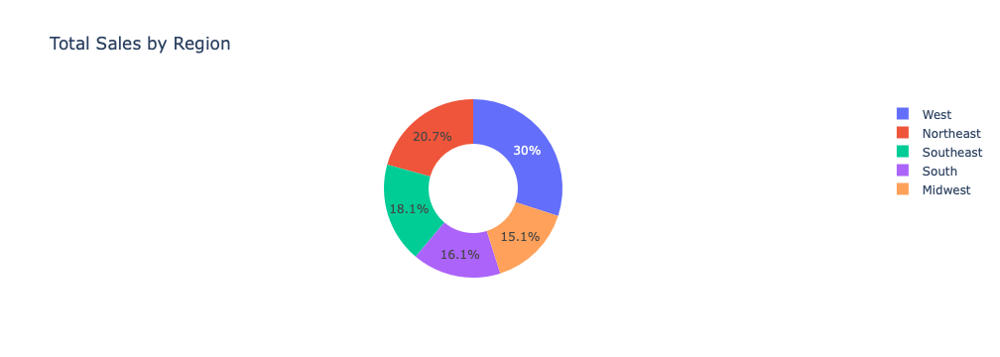

In [55]:
fig = go.Figure()
fig = px.pie(data , names='Region' , values='Total Sales' , title = 'Total Sales by Region' , hole=0.5)
fig.show() #West Coast makes up 30% of the Total Sales

Text(0.5, 1.0, 'Sales of Products by Region')

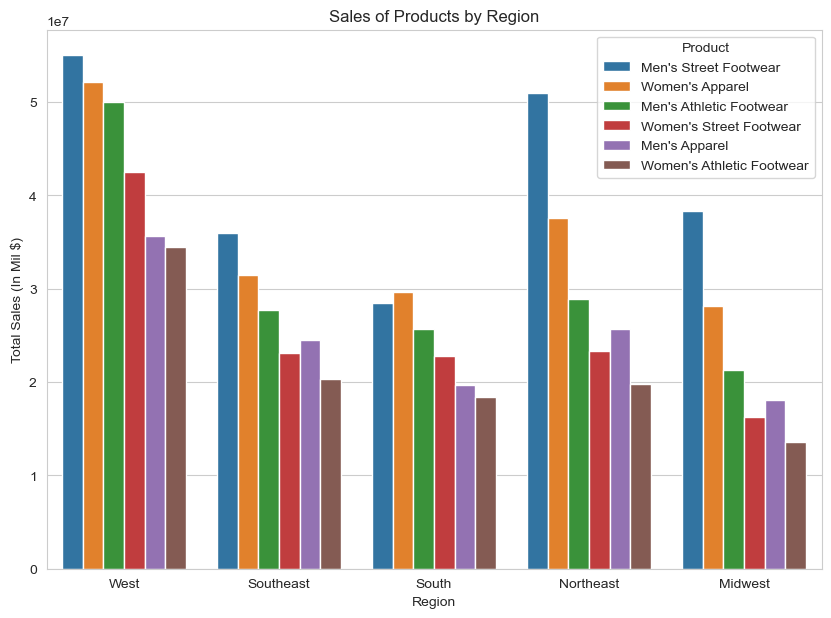

In [32]:
plt.figure(figsize = (10,7))
sns.set_style('whitegrid')
sns.barplot(product_by_region , x = 'Region', y = 'Total Sales', hue = 'Product')
plt.xlabel('Region')
plt.ylabel('Total Sales (In Mil $)')
plt.title('Sales of Products by Region')

/Users/aditya/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



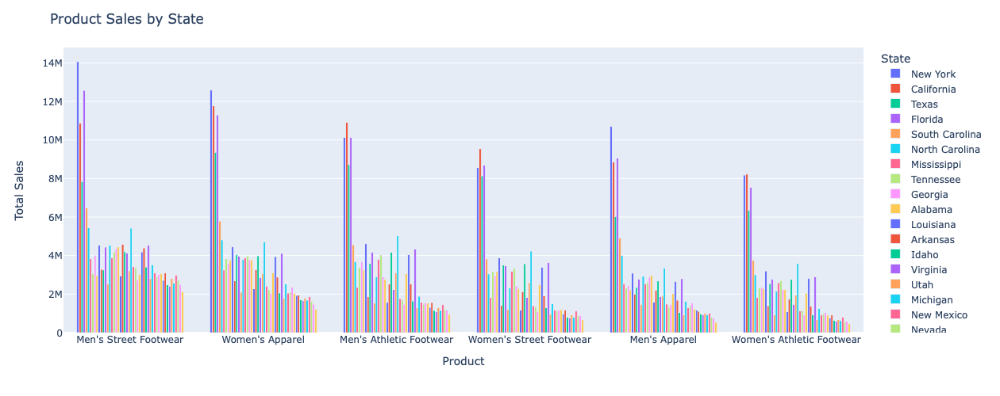

In [33]:
fig = px.bar(units_per_product, x='Product', y='Total Sales', color='State', barmode='group', height=500)
fig.update_layout(title='Product Sales by State', xaxis_title='Product', yaxis_title='Total Sales')
fig.show()

In [34]:
sales_over_time = data.groupby(['Product' , data['Invoice Date'].dt.to_period('M')])['Total Sales'].sum().reset_index()
sales_over_time.head()

,Product,Invoice Date,Total Sales
0,Men's Apparel,2020-01,2288362.0
1,Men's Apparel,2020-02,2284641.0
2,Men's Apparel,2020-03,2224467.0
3,Men's Apparel,2020-04,3789599.0
4,Men's Apparel,2020-05,2992951.0


In [35]:
pip install us

Note: you may need to restart the kernel to use updated packages.


In [36]:
df = data.copy()
from us import states

state_column = df['State']

state_abbreviations = []
for state in state_column:
    try:
        state_abbreviation = states.lookup(state).abbr
    except AttributeError:
        state_abbreviation = None
    state_abbreviations.append(state_abbreviation)

df['State Abbreviation'] = state_abbreviations

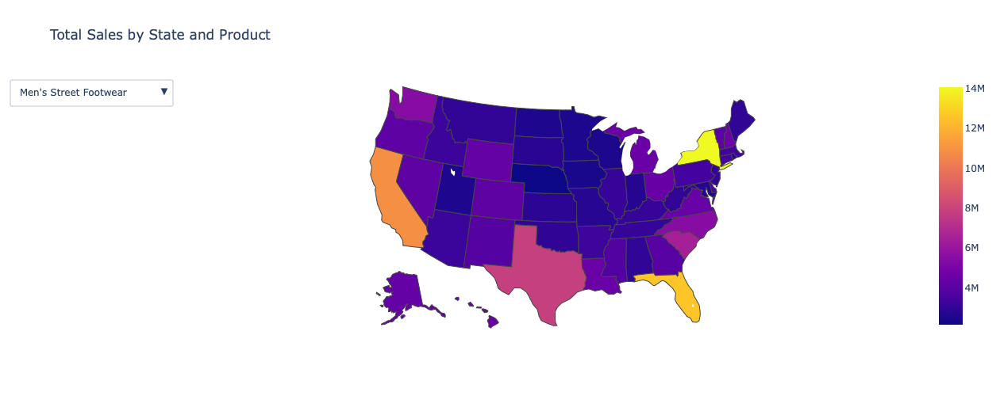

In [37]:
fig = go.Figure()
products = df['Product'].unique()

for product in products:
    filtered_df = df[df['Product'] == product]
    state_sales = filtered_df.groupby('State Abbreviation')['Total Sales'].sum().reset_index()
    state_sales['Total Sales'] = np.round(state_sales['Total Sales'] , decimals=2)
    fig.add_trace(
        go.Choropleth(
            locations=state_sales['State Abbreviation'], 
            z=state_sales['Total Sales'], 
            locationmode='USA-states', 
            colorscale='plasma',
            name=product,
            showscale=True,
            visible=(product == products[0])  # first product is visible initially
        )
    )

dropdown_buttons = [
    {'label': product, 'method': 'update', 'args': [{'visible': [product==p for p in products]}]}
    for product in products
]

fig.update_layout(
    updatemenus=[{'buttons': dropdown_buttons}],
    geo=dict(scope='usa'),
    title="Total Sales by State and Product"
)
fig.update_layout(width=1000, height=500)
fig.show()

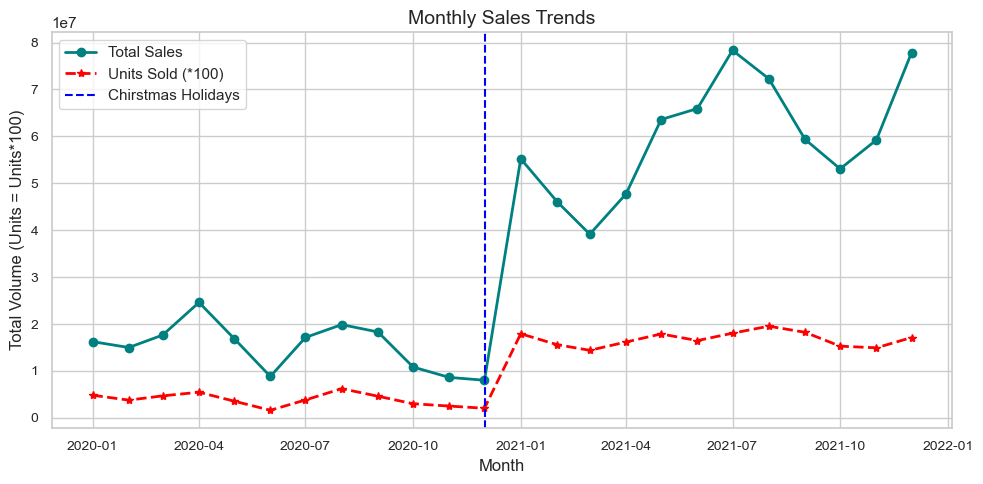

In [62]:
monthly_sales = data.groupby(data['Invoice Date'].dt.to_period('M'))['Total Sales'].sum()
monthly_units = data.groupby(data['Invoice Date'].dt.to_period('M'))['Units Sold'].sum()
# Convert the index (which is of type 'Period') to DateTime objects
monthly_sales.index = monthly_sales.index.to_timestamp()
monthly_units.index = monthly_units.index.to_timestamp()

sns.set(style="whitegrid")

plt.figure(figsize=(10, 5))
plt.plot(monthly_sales.index, monthly_sales.values, marker='o', color='teal', linestyle='-', linewidth=2 , label = 'Total Sales')
plt.plot(monthly_units.index , monthly_units.values*1e2 , marker = '*' , color = 'red' , linestyle = '--' , linewidth = 2 , label = 'Units Sold (*100)')
plt.xlabel('Month', fontsize=12)
plt.ylabel('Total Volume (Units = Units*100)', fontsize=12)
plt.title('Monthly Sales Trends', fontsize=14)
plt.xticks(rotation=0)
plt.axvline(x=1e4*1.85977, color='blue', linestyle='--', label='Chirstmas Holidays')
plt.legend()
plt.tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout()
plt.show()


In [39]:
profit_over_month = data.groupby(data['Invoice Date'].dt.to_period('M'))['Operating Margin'].mean()
profit_over_month.index = profit_over_month.index.to_timestamp()
sns.set(style="whitegrid")
plt.figure(figsize=(10, 5))
plt.axhline(y = 0.422 , linestyle = '--' , label = 'Mean Operating Profit')
plt.plot(profit_over_month.index, profit_over_month.values, marker='o', color='teal', linestyle='-', linewidth=2)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Operating Margin', fontsize=12)
plt.title('Monthly Sales Trends', fontsize=14)
plt.xticks(rotation=0)
plt.axvline(x=1e4*1.85977, color='blue', linestyle='--', label='Christmas Holidays')
plt.legend()
plt.tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

<Figure size 1000x500 with 1 Axes>

<h3>Conclusion to Regional Sales Performance Analysis</h3>
<ol>
<h4><li>West Coast is the Largest consumer of Addidas Products by Total Sales and Units Sold.</li></h4>
<h4><li>New York City has the highest Total Sales and Units Sold followed by California.</li></h4>
<h4><li>.</li></h4>
<h4><li>.</li></h4>
</ol>

<h2>Part-3 Efficiency and Sales Margin Evaluation

In [40]:
data['Sales Method'].unique()

array(['In-store', 'Outlet', 'Online'], dtype=object)

<Axes: xlabel='Sales Method', ylabel='Total Sales'>

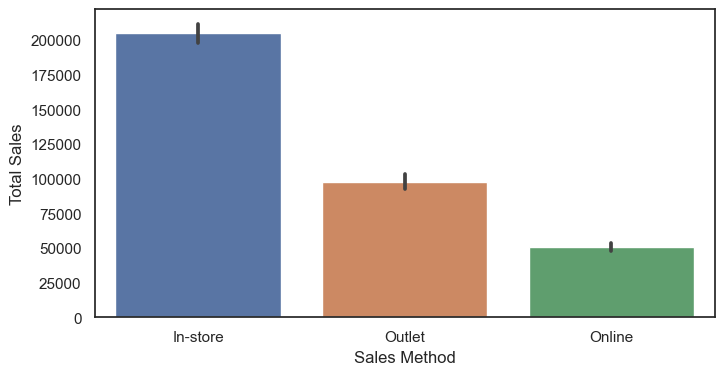

In [41]:
plt.figure(figsize = (8,4))
sns.set_style('white')
sns.barplot(x = 'Sales Method' , y = 'Total Sales' , data = data)

<Axes: xlabel='Sales Method', ylabel='Operating Profit'>

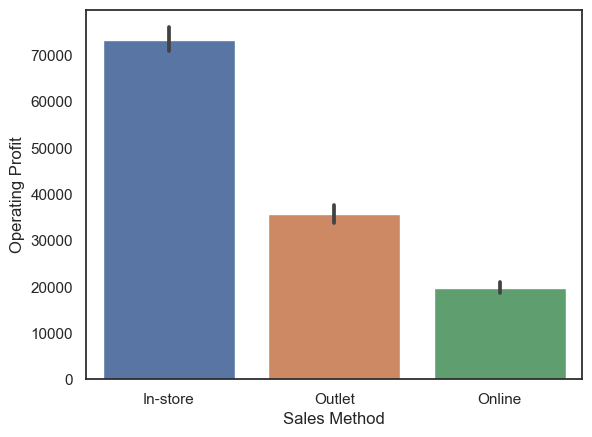

In [42]:
sns.barplot(x = 'Sales Method' , y = 'Operating Profit' , data = data)

<Axes: xlabel='Sales Method', ylabel='Operating Margin'>

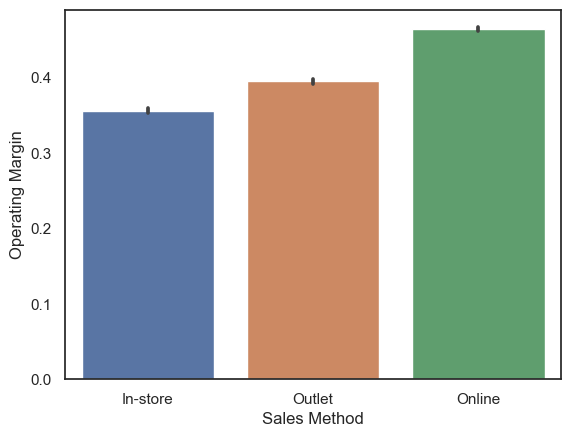

In [43]:
sns.barplot(x = 'Sales Method' , y = 'Operating Margin' , data = data)

/Users/aditya/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



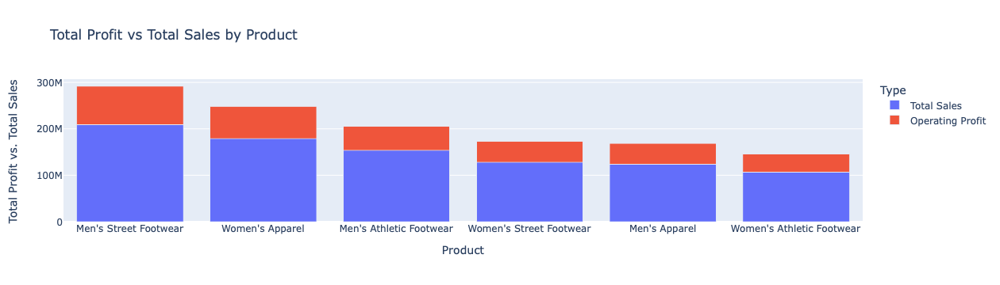

In [44]:
sum_sales_per_product = data.groupby('Product')[['Total Sales' , 'Operating Profit']].sum().reset_index()
sum_sales_per_product = sum_sales_per_product.sort_values(by = 'Total Sales' , ascending = False)
sum_sales_per_product.head()
fig = px.bar(sum_sales_per_product , x = 'Product' , y = ['Total Sales' , 'Operating Profit'] , title="Total Profit vs Total Sales by Product",
             labels={"value": "Total Profit vs. Total Sales", "variable": "Type"})
fig.show()

<h2>Part-4 Sales Method Analysis

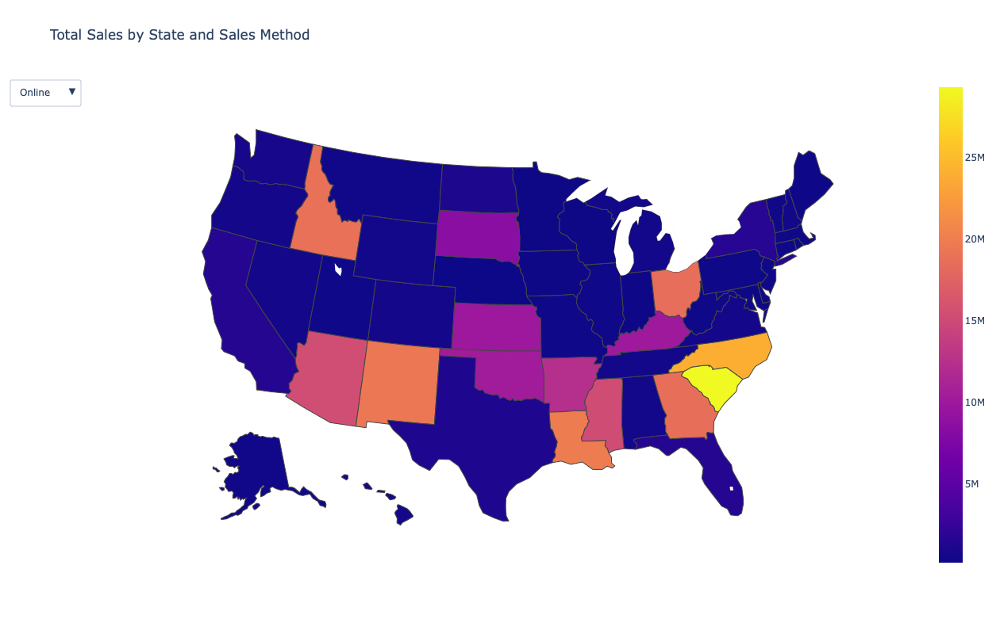

In [46]:
fig = go.Figure()
# Borrowing df from Part-2 Choropleth Map

sales_methods = df['Sales Method'].unique()
for method in sales_methods:
    fil_df = df[df['Sales Method'] == method]
    state_sales = fil_df.groupby('State Abbreviation')['Total Sales'].sum().reset_index()
    
    fig.add_trace(
        go.Choropleth(
            locations=state_sales['State Abbreviation'], 
            z=state_sales['Total Sales'], 
            locationmode='USA-states', 
            colorscale='plasma',
            name=method,
            showscale=True,
            visible=(method == sales_methods[0])  # First Method set as initial
        )
    )
    
dropdown_buttons = [
    {'label': method, 'method': 'update', 'args': [{'visible': [method==m for m in sales_methods]}]}
    for method in sales_methods
]

fig.update_layout(
    updatemenus=[{'buttons': dropdown_buttons}],
    geo=dict(scope='usa'),
    title="Total Sales by State and Sales Method"
)
fig.update_layout(width=900, height=800)
fig.show()


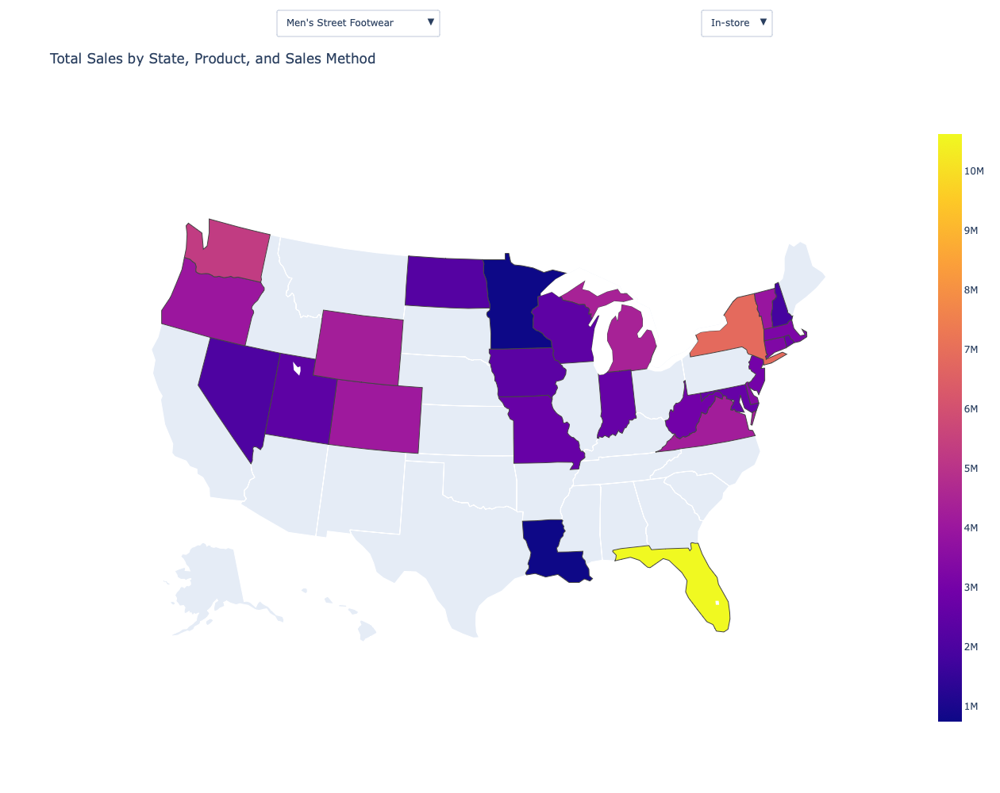

In [162]:
fig = go.Figure()
products = df['Product'].unique()
sales_methods = df['Sales Method'].unique()

for product in products:
    for method in sales_methods:
        fil_df = df[(df['Product'] == product) & (df['Sales Method'] == method)]
        state_sales = fil_df.groupby('State Abbreviation')['Total Sales'].sum().reset_index()
        fig.add_trace(
            go.Choropleth(
                locations=state_sales['State Abbreviation'], 
                z=state_sales['Total Sales'], 
                locationmode='USA-states', 
                colorscale='plasma',
                name=f"{product} - {method}",
                showscale=True,
                visible=False
        )
        )

product_buttons = [
    {'label': product, 'method': 'update', 'args': [{'visible': [trace.name.startswith(product) for trace in fig.data]}]}
    for product in products
]

sales_method_buttons = [
    {'label': method, 'method': 'update', 'args': [{'visible': [method in trace.name for trace in fig.data]}]}
    for method in sales_methods
]

fig.update_layout(
    updatemenus=[
        {'buttons': product_buttons, 'direction': 'down', 'showactive': True, 'x': 0.25, 'xanchor': 'left', 'y': 1.15, 'yanchor': 'bottom'},
        {'buttons': sales_method_buttons, 'direction': 'down', 'showactive': True, 'x': 0.75, 'xanchor': 'left', 'y': 1.15, 'yanchor': 'bottom'}
    ],
    geo=dict(scope='usa'),
    title="Total Sales by State, Product, and Sales Method"
)

if fig.data:
    fig.data[0].visible = True
fig.update_layout(width=1000, height=1000)


fig.show()

In [48]:
best_sales_performance = data.groupby(['Product','Sales Method','State']).agg({'Total Sales':'sum'}).reset_index()
best_sales_performance = best_sales_performance.sort_values(by = ['Total Sales'] , ascending=[False])
best_sales_performance.head()

,Product,Sales Method,State,Total Sales
401,Women's Apparel,Outlet,California,11484741.0
187,Men's Athletic Footwear,Outlet,California,10643905.0
217,Men's Street Footwear,In-store,Florida,10617500.0
294,Men's Street Footwear,Outlet,California,10592715.0
324,Women's Apparel,In-store,Florida,9800000.0


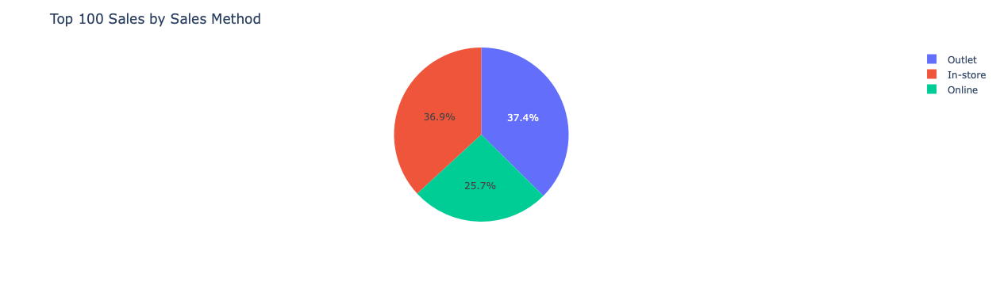

In [49]:
fig = go.Figure()
fig = px.pie(best_sales_performance.head(100), names = 'Sales Method' , values = 'Total Sales')
fig.update_layout(title = 'Top 100 Sales by Sales Method')
fig.show()

In [1]:
#It is clear that Online stores have less Total Sales but have reach across America whereas In-Store and Outlet Options make up the bulk of the sales whle
#Serving limited number of states.